In [25]:
%pylab inline
from utils import wav2audio_segment, audiofigure, Descriptor, audiofigure, normalize
import pandas as pd
from sklearn import decomposition
import librosa
from  librosa.util import frame
import scipy
import IPython
from IPython.display import display, Audio
from sklearn.cluster import KMeans,DBSCAN, estimate_bandwidth, MeanShift

%run ../utils.py

rc_default()


Populating the interactive namespace from numpy and matplotlib


In [26]:
path = "../wavs/"
fnames = ["Grisey_partiels.wav"]
T1 = 1
T2 = 120
# fnames = ["Stockhausen_Kontakte.wav"]
# T1 = 40
# T2 = 52
fnames = ["BeachBoys_SurfinUSA.wav"]
T1 = 0
T2 = None

In [27]:
n_mfcc = 20
NFFT = 2**14
HOP = int(NFFT/4)
WIN_LENGTH = NFFT
sr = 44100

In [28]:
DESCRIPTORS = [
{'name': 'delta_mfcc',
 'params': {'n_mfcc':n_mfcc,'sr':sr},
 'function': lambda self,y: librosa.feature.delta(librosa.feature.mfcc(S=Sm, **self.params)).T},

{'name': 'mfcc',
 'params': {'n_mfcc':n_mfcc,'sr':sr},
 'function': lambda self,y: librosa.feature.mfcc(S=Sm, **self.params).T },

{'name': 'rmse',
 'params': {},
 'function': lambda self,y: librosa.feature.rmse(S=Sm).T },

{'name': 'rolloff',
 'params': {'sr':sr},
 'function': lambda self,y: librosa.feature.spectral_rolloff(S=Sm,sr=sr).T },
    
{'name': 'centroid',
 'params': {'sr':sr},
 'function': lambda self,y: librosa.feature.spectral_centroid(S=Sm,**self.params).T },
    
{'name': 'scontrast',
 'params': {'sr':sr} ,
 'function' : lambda self,y: librosa.feature.spectral_contrast(S=Sm, **self.params).T },

{'name': 'chroma',
 'params':{} ,
 'function': lambda self, y: librosa.feature.chroma_stft(S=Sm, **self.params).T }]

In [35]:
audio = {}
df = pd.DataFrame()

for fname in fnames:
    sr, track  = wav2audio_segment(path+fname,T1,T2)

    S = librosa.stft(signal,n_fft=NFFT, hop_length=HOP,center=False)
    Sm = abs(S)
    
    normdata = []
    data = []
    multiindex = []
    
    for D in DESCRIPTORS:
        d = Descriptor(D)
        d.perform(track)
        data.append(d.data)
        ndata = normalize(d.data,white=True)
        normdata.append(ndata)        
            
        multiindex += [ (d.name,i) for i in range(d.data.shape[1]) ]
    

In [36]:
frames = frame(signal, frame_length=NFFT, hop_length=HOP)
t = linspace(0,HOP/float(sr)*frames.shape[1],frames.shape[1])
normframes = frames/sqrt((frames**2).mean(0))

In [37]:
columns = pd.MultiIndex.from_tuples(multiindex, names=['Descriptor', 'Feature'])
df = pd.DataFrame(np.hstack(data),columns = columns)
normdf = pd.DataFrame(np.hstack(normdata),columns = columns)

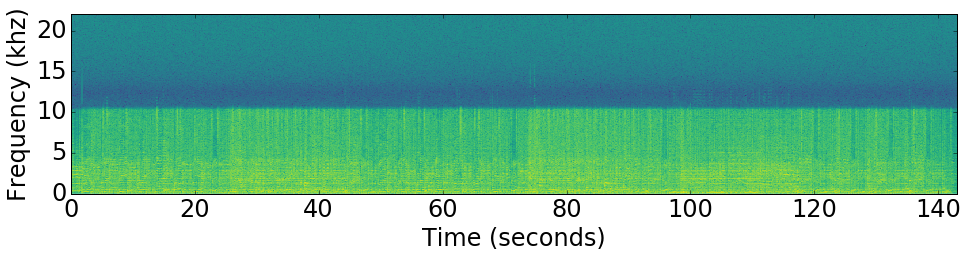

In [38]:
figure(figsize=(14,4))
extent = [t[0],t[-1],0,sr/2/1000.]
imshow(log10(Sm),aspect='auto',cmap = cm.viridis,interpolation='none', extent=extent,origin='bottom');
xlabel('Time (seconds)')
ylabel('Frequency (khz)')
tight_layout()

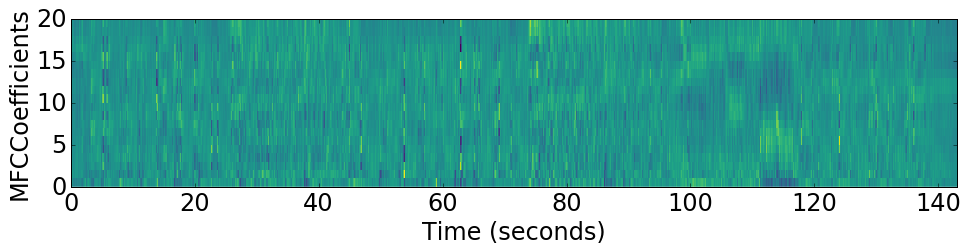

In [39]:
figure(figsize=(14,4))
extent = [t[0],t[-1],0,normdf.mfcc.values.shape[1]]
imshow(normdf.mfcc.values.T,aspect='auto',cmap = cm.viridis,interpolation='none', extent=extent);
xlabel('Time (seconds)')
ylabel('MFCCoefficients')
tight_layout()

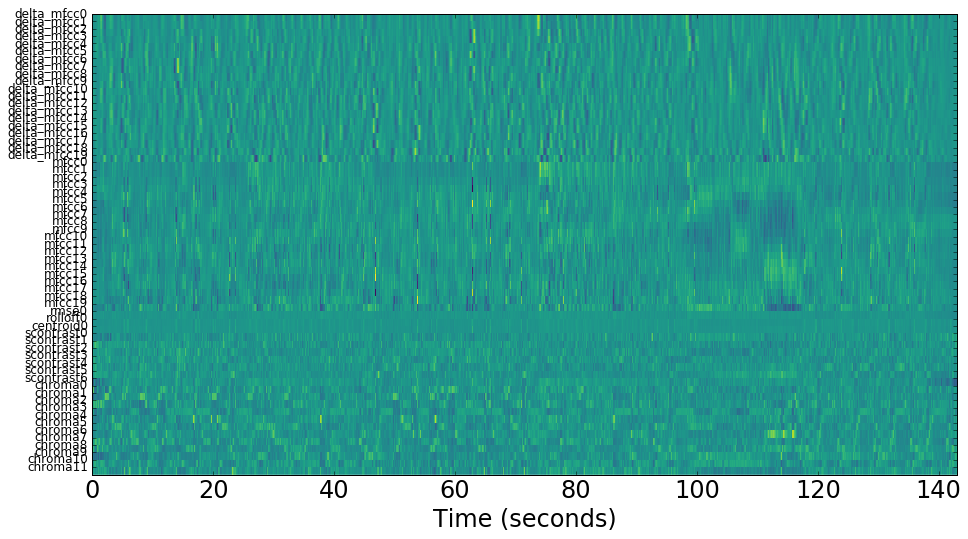

In [40]:
figure(figsize=(14,8))
ylab = [df.columns.levels[0][a]+str(df.columns.levels[1][b]) for (a,b) in zip(list(df.columns.labels[0]),list(df.columns.labels[1]))]

extent = [t[0],t[-1],0,df.values.shape[1]]
imshow(normdf.values.T,aspect='auto',cmap = cm.viridis,interpolation='none', extent=extent);
xlabel('Time (seconds)')
yticks(range(df.values.shape[1],0,-1),ylab,fontsize=12)
tight_layout()

In [44]:
pca = decomposition.PCA(n_components=40)
Ypca = pca.fit_transform(normdf.values)

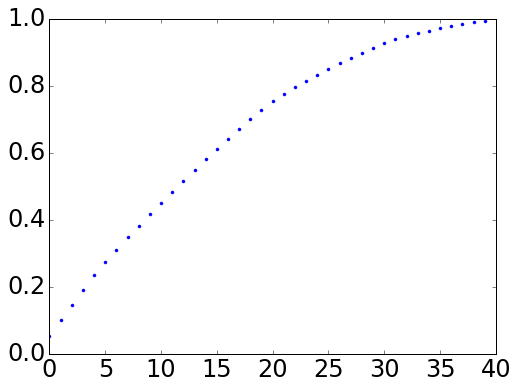

In [46]:
plot(cumsum(pca.explained_variance_ratio_),'.')
maxpca= where(cumsum(pca.explained_variance_ratio_)>0.9)[0][0]

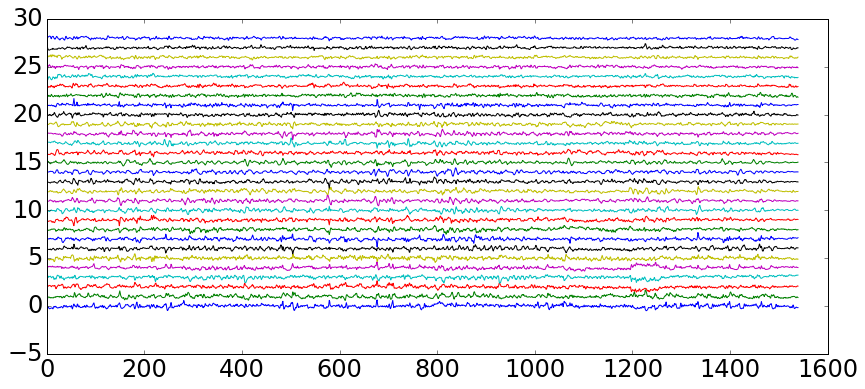

In [48]:
figure(figsize=(14,6))
Ypca = Ypca[:,:maxpca]
plot(Ypca+arange(maxpca)*1);

/usr/local/lib/python2.7/dist-packages/ipykernel/__main__.py:2: FutureWarning: 
The default value for 'return_type' will change to 'axes' in a future release.
 To use the future behavior now, set return_type='axes'.
 To keep the previous behavior and silence this warning, set return_type='dict'.
  from ipykernel import kernelapp as app


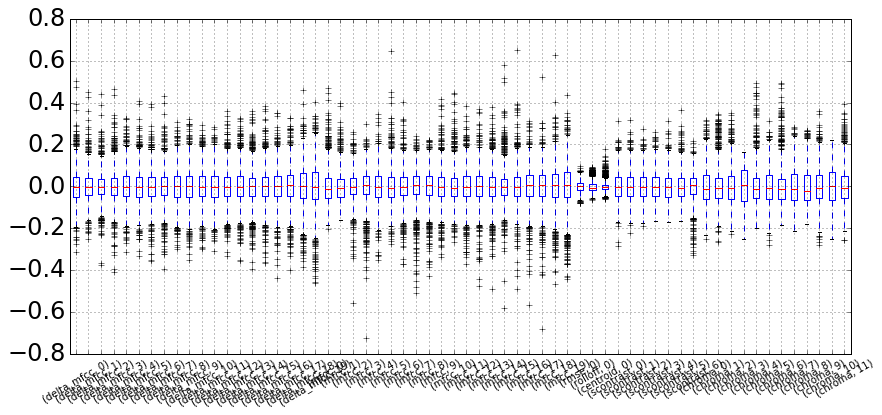

In [49]:
figure(figsize=(14,6))
normdf.boxplot();
labels = gca().get_xticklabels()
plt.setp(labels, rotation=30, fontsize=10);

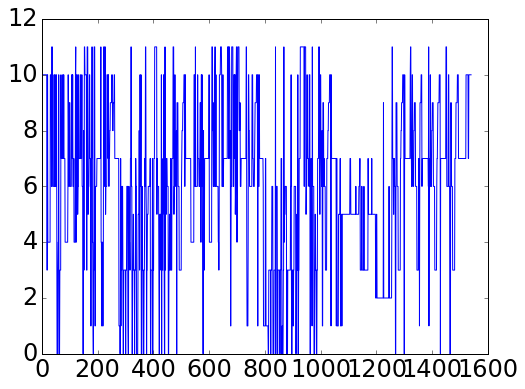

In [51]:
X = normdf.values
n_clusters=12
labels = KMeans(n_clusters=n_clusters, random_state=170).fit_predict(X)
plot(labels)
for i in range(n_clusters):
    outsignal = framesoverlap(frames[:,labels==i],HOP, WIN_LENGTH )
    display(Audio(data=outsignal,rate=sr))

In [ ]:
# savez('../talk/grisey_pca',Ypca=Ypca,frames=frames,HOP=HOP,WIN_LENGTH=WIN_LENGTH,sr=sr)
X = Ypca
n_clusters=7
labels2 = KMeans(n_clusters=n_clusters, random_state=170).fit_predict(X)
plot(labels2)
for i in range(n_clusters):
     outsignal = framesoverlap(frames[:,labels2==i],HOP, WIN_LENGTH )
     display(Audio(data=outsignal,rate=sr))

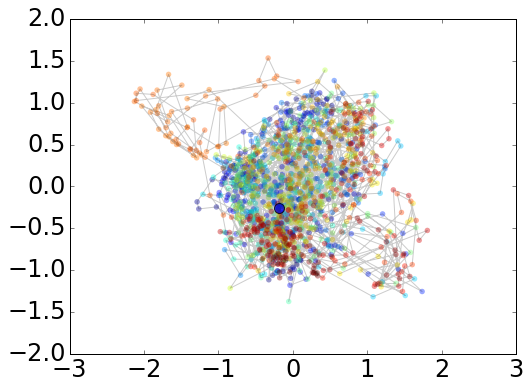

In [53]:
from sklearn import manifold

mani = manifold.Isomap()
M = mani.fit_transform(normdf.values)

time_color = plt.cm.jet(np.linspace(0,1,M.shape[0]))
plt.figure()
plt.plot(M[:, 0], M[:, 1],'k',alpha=0.2)
plt.scatter(M[:, 0], M[:, 1],c=time_color,alpha=0.4, edgecolors='none',s=30)
plt.scatter(M[0, 0], M[0, 1],alpha=0.8,s=100)

In [ ]:
from sklearn import manifold

mani3 = manifold.MDS(n_components=3)
M3 = mani3.fit_transform(Ypca)

In [56]:
mani2 = manifold.MDS(n_components=2,n_jobs=4)
M = mani2.fit_transform(normdf.values)

In [ ]:
time_color = plt.cm.jet(np.linspace(0,1,M.shape[0]))
plt.figure(figsize=(8,8))
plt.plot(M[:, 0], M[:, 1],'k',alpha=0.2)
plt.plot(M[0, 0], M[0, 1],'dk',alpha=0.4,ms=20)
plt.plot(M[-1, 0], M[-1, 1],'*k',alpha=0.4,ms=20)
cl = colorline(M[:, 0], M[:, 1],cmap=plt.cm.jet,alpha=0.4)
# plt.scatter(M[:, 0], M[:, 1],c=time_color,alpha=0.4, edgecolors='none',s=30);
colorbar(cl)

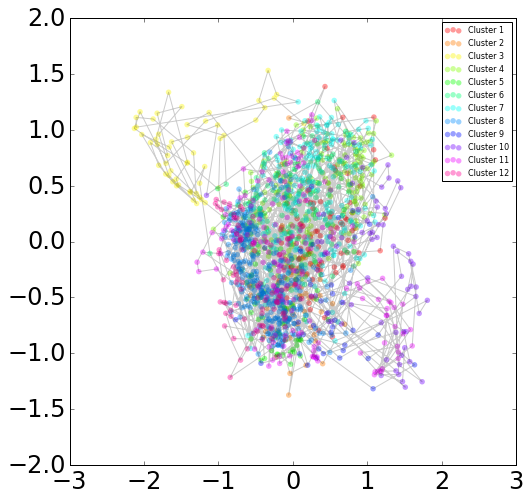

In [55]:
time_color = plt.cm.hsv(labels/float(n_clusters))
plt.figure(figsize=(8,8))
plt.plot(M[:, 0], M[:, 1],'k',alpha=0.2)
for i in range(n_clusters):
    ix = labels==i
    plt.scatter(M[ix, 0], M[ix, 1],c=time_color[ix],alpha=0.4, edgecolors='none',s=30,label='Cluster '+str(i+1));
    
legend();

In [ ]:
for eps in linspace(0.01,0.5,100):
    db = DBSCAN(eps=eps, min_samples=4).fit(Ypca)
    print(eps,np.unique(db.labels_),sum(db.labels_==-1))

In [ ]:
db = DBSCAN(eps=0.410, min_samples=8).fit(Ypca)
plot(db.labels_)
for i in np.unique(db.labels_):
    outsignal = framesoverlap(frames[:,db.labels_==i],HOP, WIN_LENGTH )
    display(Audio(data=outsignal,rate=sr))

In [ ]:
X = Ypca
bandwidth = estimate_bandwidth(X, quantile=0.5, n_samples=500)
ms = MeanShift(bandwidth=bandwidth, bin_seeding=True)
ms.fit(X)
labels = ms.labels_
plot(labels)
for i in np.unique(labels):
    outsignal = framesoverlap(frames[:,labels==i],HOP, WIN_LENGTH )
    display(Audio(data=outsignal,rate=sr))